In [1]:
import warnings
warnings.filterwarnings("ignore")
from utils.io_utils import *
from utils.opensim_kinematics_utils import *
from utils.data_processing_utils import *
from utils.analysis_utils import *

In [2]:
# define variables 

DATA_FOLDER = "stimuloop patient data"
RESULTS_FOLDER = "stimuloop_displacement_error_results"

N_DAYS = 16 # 16 because we include T0

MARKERS = [
    "LASIS", "RASIS", "LPSIS", "RPSIS", "LLTHI", "LLEK", "LMEK", "LLSHA", "LLM",
    "LMM", "LHEE", "LMT2", "LMT5", "RLTHI", "RLEK", "RMEK", "RLSHA", "RLM", "RMM",
    "RHEE", "RMT2", "RMT5", "C7", "T10", "XIPH", "JN"
]

MARKERSET_FILE = "example_markerset_files/HMB2_MODEL_markers.xml"

TEMPLATE_SCALING_SETUP_FILE = "template_scaling_setup.xml"

In [3]:
os.makedirs(RESULTS_FOLDER, exist_ok=True)

# Part 1: Comparison of 16 scaled models with single averaged model, based on the static calibration file - for ALL PATIENTS 

This part of the code gathers all the calibration data from the patients and processes the .c3d calibration files of the 16 training days for all the available StimuLOOP patients.
Once the calibration files are converted to .trc and aligned, they get averaged into a single corrected .trc calibration file used to scale the averaged model (one for each patient).
The marker positions in the averaged calibration file then get compared with all the marker positions in the 16 calibration files (for each patient separately).

In [4]:
# iterate through all the patient sub-folders in DATA_FOLDER
for item in os.listdir(DATA_FOLDER):

    # STEP 1: COLLECTION OF .c3d CALIBRATION FILES FOR 16 DAYS FOR EACH PATIENT
    patient_data = os.path.join(DATA_FOLDER, item)
    patient = item

    # check if all the 16 calibration files are available
    expected_files = [f"CalibrationT{i}.c3d" for i in range(N_DAYS)]
    missing_files = [f for f in expected_files if not os.path.exists(os.path.join(patient_data, f))]
    # if not, we skip this patient
    if missing_files:
        print(f"⛔ Skipping patient {patient} — missing files: {missing_files}")
        continue

    print(f"✅ CURRENTLY PROCESSING PATIENT {patient}")

    # create a sub-folder for each patient in RESULTS_FOLDER
    patient_results_path = os.path.join(RESULTS_FOLDER, patient)
    os.makedirs(patient_results_path, exist_ok=True)

    # STEP 2: CONVERSION FROM .c3d to .trc AND ALIGNMENT
    # THE .trc CALIBRATION FILES NEED TO BE ALIGNED SO THAT THEY CAN BE AVERAGED LATER
    # TO SCALE A "CORRECTED" MODEL
    list_paths = []

    for i in range(N_DAYS):

        # conversion of .c3d to .trc
        trc_out = os.path.join(patient_data, f"CalibrationT{i}.trc")
        convert_c3d_to_trc(
            os.path.join(patient_data, f"CalibrationT{i}.c3d"),
            output_trc=trc_out,
            start_time=0,
            end_time=1,
            include_markers=MARKERS
        )
        list_paths.append(trc_out)

    # once all the calibration files of the patient are converted .trc, the .trc files get aligned
    # here we do not use non rigid point alignment and only align based on the recentering of each anatomical segment independently,
    # depending on the CoM of assigned markers for each segment
    # it can also be chosen to only center around the pelvis or to only do non rigid point alignment for example
    aligned_sets = prepare_aligned_calibrations(
        file_paths=list_paths,
        output_dir=patient_results_path,
        non_rigid=False,
        recenter_strategy="segments"
    )

    # save 16 aligned .trc calibration files that will be used to compute the average .trc calib file
    for i, pose in enumerate(aligned_sets):
        save_aligned_trc(
            aligned_pose=pose,
            reference_trc_path=list_paths[i],
            output_trc_path=os.path.join(patient_results_path, f"CalibrationT{i}_aligned.trc"),
            marker_names=MARKERS,
            start_time=0.0,
            end_time=1.0,
            frequency=100.0
        )

    # STEP 3: COMPUTE AVERAGE .trc CALIBRATION FILE FROM 16 ALIGNED CALIBRATION FILES OF THE PATIENT
    load_average_and_save_trc_bis(
        folder_path=patient_results_path,
        reference_trc_path=os.path.join(patient_results_path, "CalibrationT1_aligned.trc"),
        output_path=os.path.join(patient_results_path, "Calibration_average_aligned.trc"),
        reference_marker_order=MARKERS,
        startswith="Calibration"
    )

    # STEP 4: SCALE THE "CORRECTED" MODEL WITH THE AVERGADED .trc CALIBRATION FILE
    scaling("average",
        patient_results_path,
        MARKERS,
        TEMPLATE_SCALING_SETUP_FILE,
        MARKERSET_FILE,
        trc_calib_file=os.path.join(patient_results_path, "Calibration_average_aligned.trc")
    )

    # STEP 5: PLOT THE DISTANCE OF EACH MARKER BETWEEN THE 16 INITIAL MODELS FOR EACH DAY AND THE UNIQUE AVERAGED MODEL
    # plot with markers on the x-axis (1 box per marker, 1 point per day)
    compare_markers_to_average(patient_results_path, patient, os.path.join(RESULTS_FOLDER, f"{patient}_PerMarker"))
    # plot with days on the x-axis (1 box per day, 1 point per marker)
    compare_markers_by_day(patient_results_path, patient, os.path.join(RESULTS_FOLDER, f"{patient}_PerDay")) 

⛔ Skipping patient Klaske — missing files: ['CalibrationT0.c3d', 'CalibrationT1.c3d', 'CalibrationT2.c3d', 'CalibrationT3.c3d', 'CalibrationT4.c3d', 'CalibrationT5.c3d', 'CalibrationT6.c3d', 'CalibrationT7.c3d', 'CalibrationT8.c3d', 'CalibrationT9.c3d', 'CalibrationT10.c3d', 'CalibrationT11.c3d', 'CalibrationT12.c3d', 'CalibrationT13.c3d', 'CalibrationT14.c3d', 'CalibrationT15.c3d']
⛔ Skipping patient Klaske2 — missing files: ['CalibrationT0.c3d', 'CalibrationT1.c3d', 'CalibrationT2.c3d', 'CalibrationT3.c3d', 'CalibrationT4.c3d', 'CalibrationT5.c3d', 'CalibrationT6.c3d', 'CalibrationT7.c3d', 'CalibrationT8.c3d', 'CalibrationT9.c3d', 'CalibrationT10.c3d', 'CalibrationT11.c3d', 'CalibrationT12.c3d', 'CalibrationT13.c3d', 'CalibrationT14.c3d', 'CalibrationT15.c3d']
✅ CURRENTLY PROCESSING PATIENT PD001
618
0 100
✅ Conversion terminée : stimuloop patient data\PD001\CalibrationT0.trc
843
0 100
✅ Conversion terminée : stimuloop patient data\PD001\CalibrationT1.trc
715
0 100
✅ Conversion termi

# Part 2: Comparison of 16 scaled models with single averaged model, based on the static calibration file - for A SINGLE CHOSEN PATIENT
This part of the code gathers and processes the .c3d calibration files of the 16 training days for the chosen StimuLOOP patient.
Once the calibration files are converted to .trc and aligned, they get averaged into a single corrected .trc calibration file used to scale the averaged model.
The marker positions in the averaged calibration file then get compared with all the marker positions in the 16 calibration files.

In [5]:
# define patient ID of patient you want to look at
PATIENT_ID = "S001"

437
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT0.trc
540
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT1.trc
557
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT2.trc
602
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT3.trc
590
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT4.trc
464
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT5.trc
742
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT6.trc
408
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT7.trc
679
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT8.trc
481
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT9.trc
717
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT10.trc
426
0 100
✅ Conversion terminée : stimuloop patient data\S001\CalibrationT11.trc
563
0 100
✅ Conversion terminée : stim

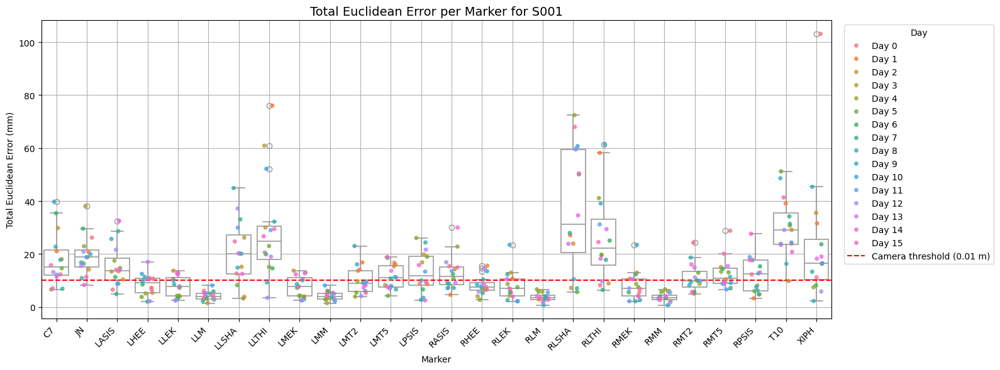

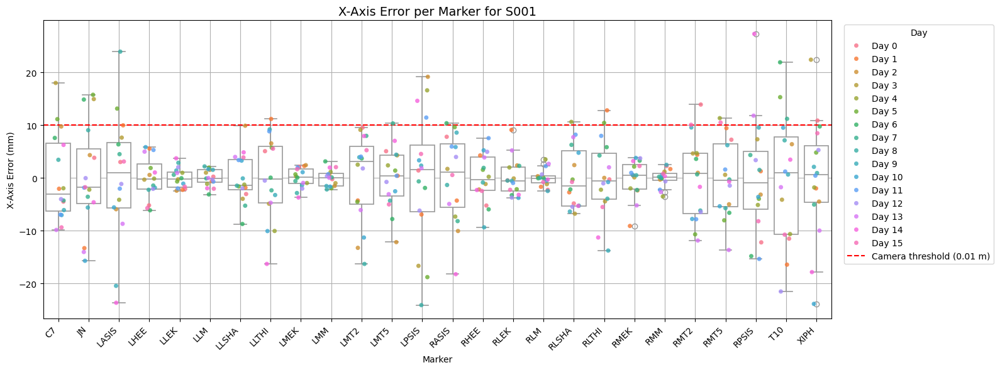

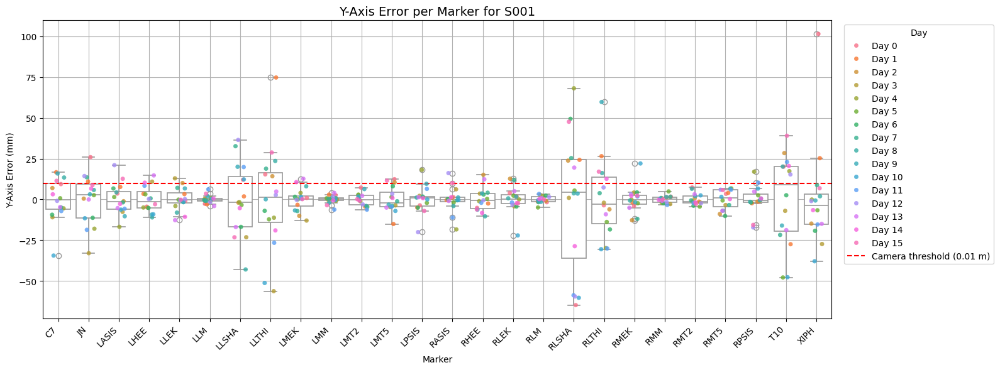

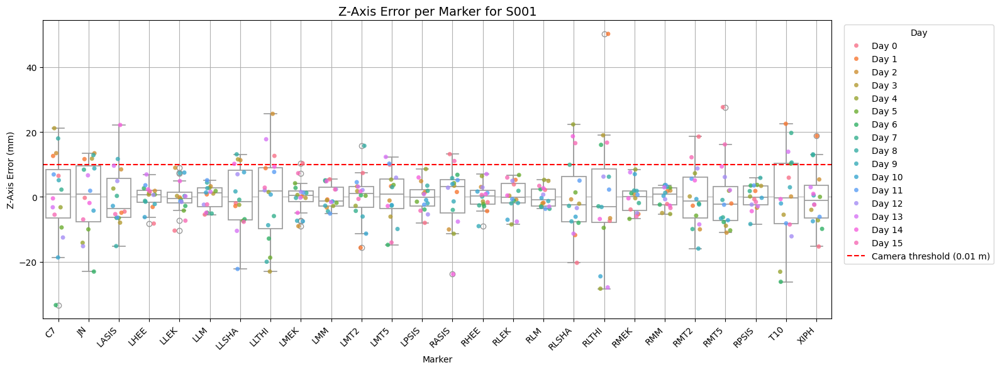

['aligned_day0.csv', 'aligned_day1.csv', 'aligned_day10.csv', 'aligned_day11.csv', 'aligned_day12.csv', 'aligned_day13.csv', 'aligned_day14.csv', 'aligned_day15.csv', 'aligned_day2.csv', 'aligned_day3.csv', 'aligned_day4.csv', 'aligned_day5.csv', 'aligned_day6.csv', 'aligned_day7.csv', 'aligned_day8.csv', 'aligned_day9.csv']


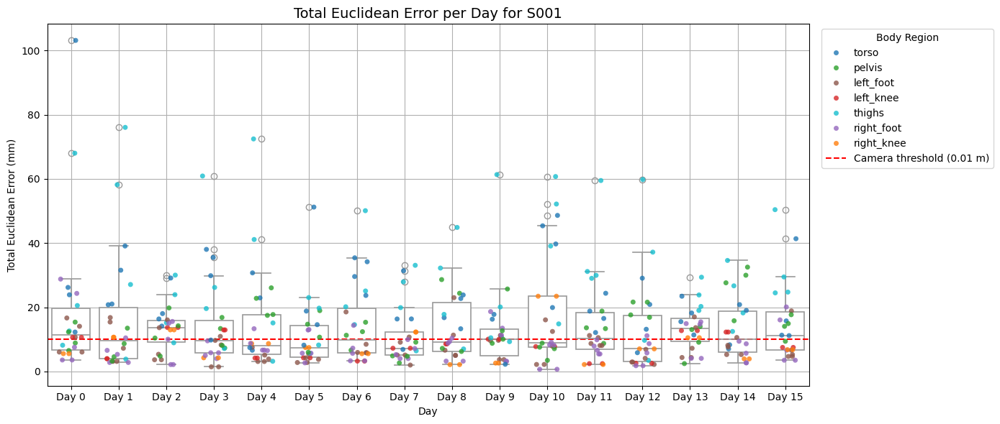

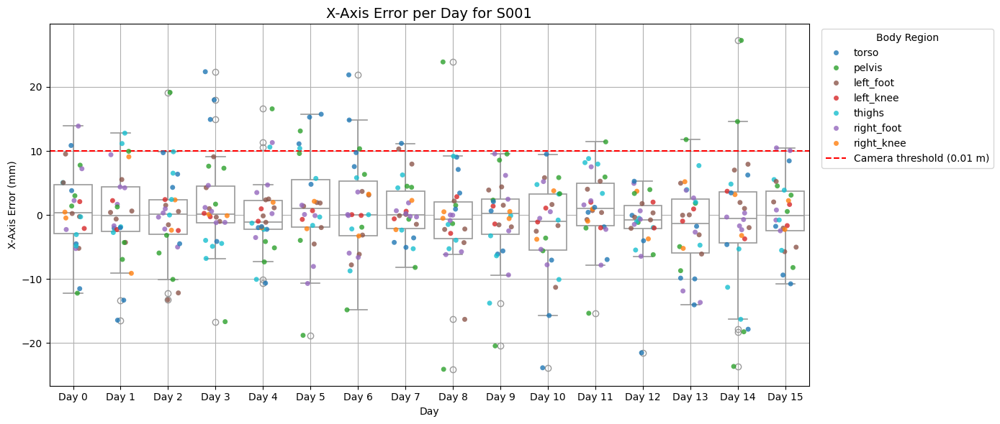

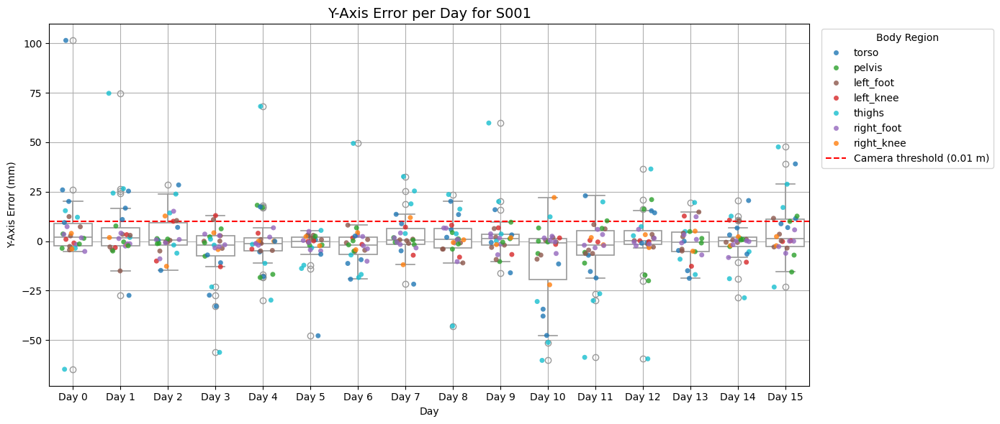

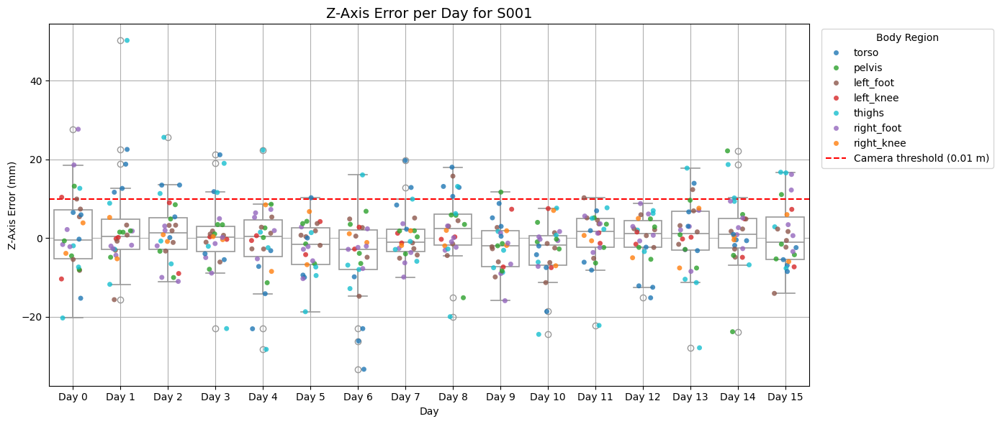

In [6]:
# STEP 1: COLLECTION OF .c3d CALIBRATION FILES FOR 16 DAYS
patient_data = os.path.join(DATA_FOLDER, PATIENT_ID)


# check if all the 16 calibration files are available
expected_files = [f"CalibrationT{i}.c3d" for i in range(N_DAYS)]
missing_files = [f for f in expected_files if not os.path.exists(os.path.join(patient_data, f))]
# if not, we skip raise an error
if missing_files:
    print(f"⛔ Skipping patient {PATIENT_ID} — missing files: {missing_files}")
    raise Exception(f"Missing calibration files for patient {PATIENT_ID}")

# create a sub-folder for each patient in RESULTS_FOLDER
patient_results_path = os.path.join(RESULTS_FOLDER, PATIENT_ID)
os.makedirs(patient_results_path, exist_ok=True)

# STEP 2: CONVERSION FROM .c3d to .trc AND ALIGNMENT
# THE .trc CALIBRATION FILES NEED TO BE ALIGNED SO THAT THEY CAN BE AVERAGED LATER
# TO SCALE A "CORRECTED" MODEL
list_paths = []

for i in range(N_DAYS):

    # conversion of .c3d to .trc
    trc_out = os.path.join(patient_data, f"CalibrationT{i}.trc")
    convert_c3d_to_trc(
        os.path.join(patient_data, f"CalibrationT{i}.c3d"),
        output_trc=trc_out,
        start_time=0,
        end_time=1,
        include_markers=MARKERS
    )
    list_paths.append(trc_out)

# once all the calibration files of the patient are converted .trc, the .trc files get aligned
# here we do not use non rigid point alignment and only align based on the recentering of each anatomical segment independently,
# depending on the CoM of assigned markers for each segment
# it can also be chosen to only center around the pelvis or to only do non rigid point alignment for example
aligned_sets = prepare_aligned_calibrations(
    file_paths=list_paths,
    output_dir=patient_results_path,
    non_rigid=False,
    recenter_strategy="segments"
    )

# save 16 aligned .trc calibration files that will be used to compute the average .trc calib file
for i, pose in enumerate(aligned_sets):
    save_aligned_trc(
        aligned_pose=pose,
        reference_trc_path=list_paths[i],
        output_trc_path=os.path.join(patient_results_path, f"CalibrationT{i}_aligned.trc"),
        marker_names=MARKERS,
        start_time=0.0,
        end_time=1.0,
        frequency=100.0
    )

# STEP 3: COMPUTE AVERAGE .trc CALIBRATION FILE FROM 16 ALIGNED CALIBRATION FILES OF THE PATIENT
load_average_and_save_trc_bis(
    folder_path=patient_results_path,
    reference_trc_path=os.path.join(patient_results_path, "CalibrationT1_aligned.trc"),
    output_path=os.path.join(patient_results_path, "Calibration_average_aligned.trc"),
    reference_marker_order=MARKERS,
    startswith="Calibration"
)

# STEP 4: SCALE THE "CORRECTED" MODEL WITH THE AVERGADED .trc CALIBRATION FILE
scaling("average",
    patient_results_path,
    MARKERS,
    TEMPLATE_SCALING_SETUP_FILE,
    MARKERSET_FILE,
    trc_calib_file=os.path.join(patient_results_path, "Calibration_average_aligned.trc")
)

# STEP 5: PLOT THE DISTANCE OF EACH MARKER BETWEEN THE 16 INITIAL MODELS FOR EACH DAY AND THE UNIQUE AVERAGED MODEL
print("RESULTS FOR PATIENT ", PATIENT_ID)
# plot with markers on the x-axis (1 box per marker, 1 point per day)
compare_markers_to_average(patient_results_path, PATIENT_ID)
# plot with days on the x-axis (1 box per day, 1 point per marker)
compare_markers_by_day(patient_results_path, PATIENT_ID)
